## SCODA explorer 
Aug. 07, 2023, MLBI-lab@DKU

### Install required packages and import them

In [ ]:
!pip install scanpy
!pip install scoda-viz

In [1]:
import os, copy, warnings, tarfile, shutil
import anndata
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

from scodaviz.plotlib import get_population, plot_population, plot_population_grouped
from scodaviz.plotlib import plot_sankey_e, plot_pct_box, get_gsea_summary, plot_gsea_all
from scodaviz.plotlib import plot_cci_dot, plot_cci_circ, plot_cci_circ_m, get_markers_from_deg
from scodaviz.plotlib import cci_remove_common, cci_get_ni_mat, cci_get_df_to_plot
from scodaviz.plotlib import plot_cnv, plot_marker_exp, plot_deg, plot_gsea_res, plot_td_stats

warnings.filterwarnings('ignore') 

https://github.com/combio-dku


### Upload processed file

In [ ]:
from google.colab import files

## Upload the downloaded tar.gz file
uploaded = files.upload()
os.listdir()

In [3]:
uploaded = '2023.09.10.01.07.35_220.149.232.155_results.tar.gz'

In [ ]:
## Decompress uploaded tar.gz file and move it to the current directory
if uploaded.split('.')[-1] == 'gz':
    extract_path = 'uploaded'
    with tarfile.open(uploaded, "r:gz") as tar:
        tar.extractall(path=extract_path)
        
    file = os.listdir(extract_path)[0]
    file = extract_path + '/%s' % file
    if os.path.isdir(file):
        file_h5ad = os.listdir(file)[0]
        file = file + '/%s' % (file_h5ad)
        
    shutil.move(file, '.')
    print('Your file: %s' % file_h5ad)

### Load data & Set experiment parameters

In [5]:
### Load data #####
adata_t = sc.read_h5ad(file_h5ad)
adata_t

AnnData object with n_obs × n_vars = 8000 × 29733
    obs: 'sample', 'condition', 'celltype_major', 'celltype_minor', 'celltype_subset', 'cnv_cluster', 'tumor_dec', 'tumor_score', 'ref_ind', 'celltype_minor_rev'
    var: 'gene'
    uns: 'CCI', 'Celltype_marker_DB', 'DEG', 'DEG_stat', 'GSA_down', 'GSA_up', 'GSEA', 'cnv', 'cnv_addon_summary', 'cnv_ref_celltypes'
    obsm: 'HiCAT_result', 'X_cnv', 'X_cnv_pca', 'cnv_addon_results'

## celltype annotation
### UMAP

In [6]:
adata = adata_t[:,:]

## UMAP with celltype annotation, sample, condition
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

sc.pp.highly_variable_genes(adata, n_top_genes = 2000) # , flavor = 'seurat_v3')

## PCA
N_pca = 15
sc.tl.pca(adata, svd_solver='arpack', n_comps = 15, use_highly_variable = True)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=N_pca)
sc.tl.leiden(adata, resolution = 1)

sc.tl.umap(adata) 

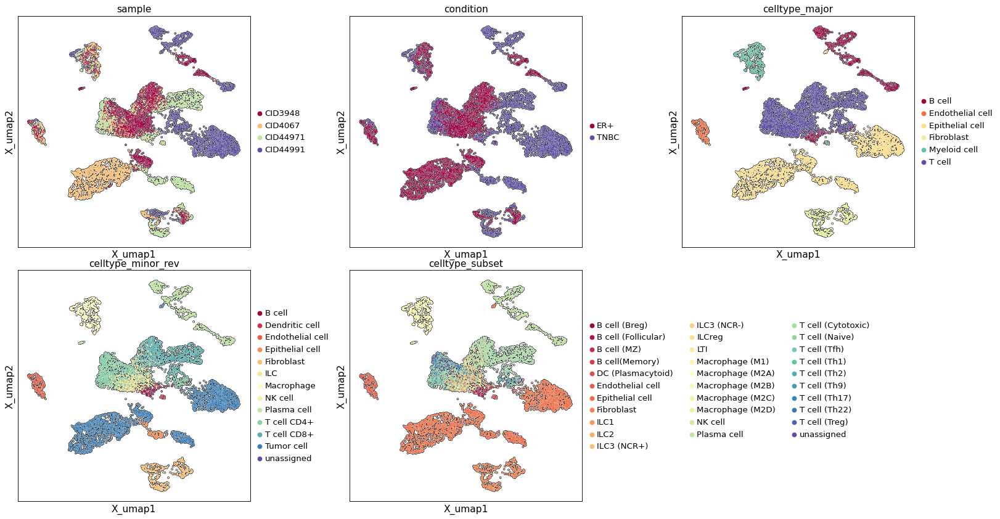

In [7]:
items_to_plot = ['sample', 'condition', 'celltype_major', 
                 'celltype_minor_rev', 'celltype_subset'] #, 'CD3D'] 

ws_hs = (0.3, 0.1)
# adata.obsm['X_umap'] = adata.obsm['X_org_umap']
sc.settings.set_figure_params(figsize=(6, 6), dpi=80, facecolor='white')
fig = sc.pl.embedding( adata, basis = 'X_umap', neighbors_key = 'neighbors',
                       color=items_to_plot, wspace = ws_hs[0], hspace = ws_hs[1], legend_fontsize = 12, 
                       ncols = 3, palette = 'Spectral', return_fig = True, add_outline = True) 

plt.show()

### Cell Population

In [8]:
celltype_col = 'celltype_minor_rev'
if celltype_col not in list(adata_t.obs.columns.values):
    celltype_col = 'celltype_minor_rev'

df_cnt, df_pct= get_population( adata_t.obs['sample'], 
                                adata_t.obs[celltype_col], sort_by = [] )
df_cnt

,B cell,Dendritic cell,Endothelial cell,Epithelial cell,Fibroblast,ILC,Macrophage,NK cell,Plasma cell,T cell CD4+,T cell CD8+,Tumor cell,unassigned
CID3948,4,3,71,2,66,443,96,0,200,441,448,226,0
CID4067,3,2,99,2,120,172,150,0,0,80,147,1225,0
CID44971,102,16,47,157,192,15,146,1,12,541,536,235,0
CID44991,20,2,13,4,83,1,59,0,442,154,101,1119,2


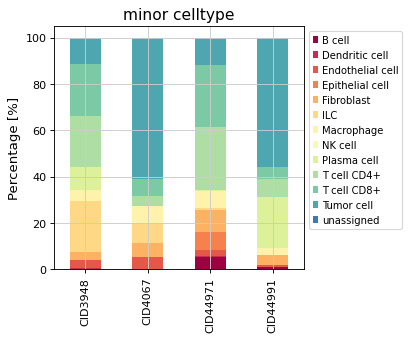

In [9]:
plot_population( df_pct, title = 'minor celltype', title_fs = 14, 
                 label_fs = 12, tick_fs = 10, tick_rot = 90,
                 legend_fs = 9, legend_loc = 'upper left', bbox_to_anchor = (1,1), 
                 legend_ncol = 1, cmap_name = None, figsize=(4, 4), return_fig = False)

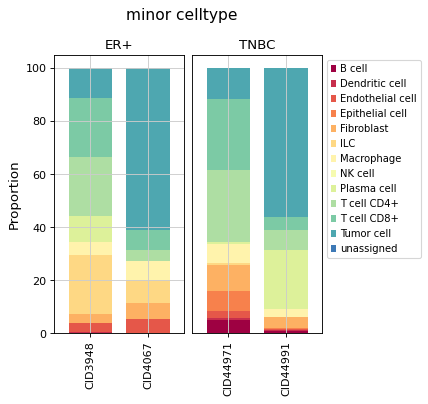

In [10]:
sg_map = {}
slst = list(df_cnt.index.values)
for s in slst:
    b = adata_t.obs['sample'] == s
    g = list(adata_t.obs.loc[b, 'condition'])[0]
    sg_map[s] = g
    
plot_population_grouped( df_pct, sg_map, sort_by = ['Tumor cell'], 
                         title = 'minor celltype', title_fs = 14, title_y = 1.1,
                         label_fs = 12, tick_fs = 10, tick_rot = 90,
                         legend_fs = 9, legend_loc = 'upper left', bbox_to_anchor = (1,1), 
                         legend_ncol = 1, cmap_name = None, figsize=(4, 4), return_fig = False)

In [11]:
## Tumor identification: UMAP, CNV heatmap, tumor markers, dotplot
lst = [adata_t.obs['celltype_minor'], adata_t.obs['celltype_major'], 
       adata_t.obs['tumor_dec'], adata_t.obs['celltype_minor_rev']]
plot_sankey_e( lst, title = None, fs = 13, WH = (800, 500), th = 10, title_y = 0.8 )
plt.show()

### Marker expression pattern

T cell (Naive): 8 > 1, T cell (Cytotoxic): 8 > 4, Fibroblast: 22 > 21, T cell (Th17): 16 > 2, T cell (Treg): 27 > 14, DC (Plasmacytoid): 11 > 8, Macrophage (M1): 32 > 2, B cell (MZ): 14 > 2, B cell (Follicular): 13 > 1, T cell (Tfh): 19 > 8, Macrophage (M2A): 38 > 9, T cell (Th2): 17 > 2, Plasma cell: 10 > 6, B cell(Memory): 14 > 2, Macrophage (M2C): 35 > 5, T cell (Th1): 15 > 4, B cell (Breg): 13 > 1, T cell (Th22): 13 > 2, Macrophage (M2B): 31 > 2, ILC1: 13 > 2, LTI: 17 > 7, Macrophage (M2D): 26 > 0, T cell (Th9): 9 > 1, NK cell: 16 > 11, ILCreg: 10 > 3, ILC3 (NCR-): 10 > 0, ILC2: 14 > 2, ILC3 (NCR+): 12 > 0
Num markers selected: 111 -> 111


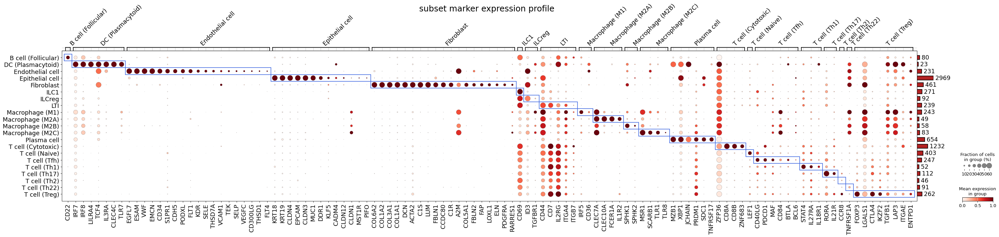

In [12]:
mkr_dict = copy.deepcopy( adata_t.uns['Celltype_marker_DB']['subset_markers_dict'] )
target_lst = list(adata_t.obs['celltype_subset'].unique())

title = 'subset marker expression profile  \n \n  \n \n '

pes, pexs, md = plot_marker_exp( adata_t, target_lst, 'celltype_subset', mkr_dict, title = title, 
                          rend = None, level = 0, cutoff = 0.05, pnsh12 = '100000', rem_cmn = True, 
                          dot_max = 0.6, fs_text = 16, swap_ax = False, to_exclude = [], 
                          comb_mkrs = False, vg_rot = 45, lw = 1.5, fs_title = 22, vg_hgt = 1.2, 
                          Npt = 20, Npt_tot = 200, ret_pe = True, legend = True,
                          type_level_g = None, other_genes = [], show_unassigned = False, 
                          add_rect = True, standard_scale = 'var', figsize = None )


### CNV & tumor cell identification

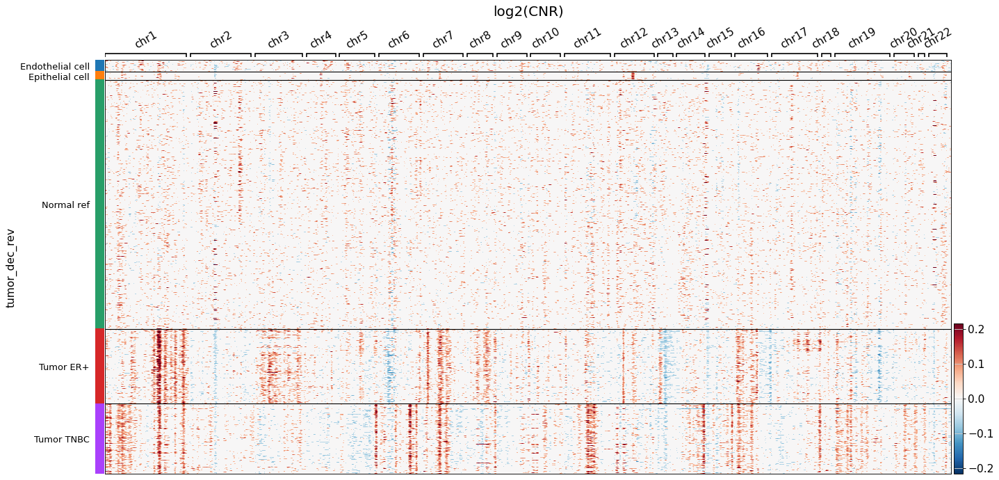

In [13]:
adata = adata_t[:,:]

cond_col = 'condition'
clst = adata.obs[cond_col].unique()
adata.obs['tumor_dec_rev'] = adata.obs['celltype_major'].copy(deep = True).astype(str)
b = adata.obs['tumor_dec_rev'].isin(adata.uns['cnv_ref_celltypes'])
adata.obs.loc[b, 'tumor_dec_rev'] = 'Normal ref'
for c in clst:
    b = (adata.obs[cond_col] == c) & (adata.obs['tumor_dec'] == 'Tumor')
    s = 'Tumor %s' % c
    adata.obs.loc[b, 'tumor_dec_rev'] = s

plot_cnv( adata, groupby = 'tumor_dec_rev', title_fs = 18, label_fs = 12,
          figsize = (20, 10), swap_axes = False, 
          var_group_rotation = 30, cmap='RdBu_r', vmax = 1)

### CNV UMAP

In [14]:
adata = adata_t[:,:]

N_pca = 15
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=N_pca, 
                use_rep = 'X_cnv_pca', key_added = 'cnv_neighbors')

ad_tmp = sc.tl.umap(adata, neighbors_key = 'cnv_neighbors', copy = True)    
adata.obsm['X_cnv_umap'] = ad_tmp.obsm['X_umap']

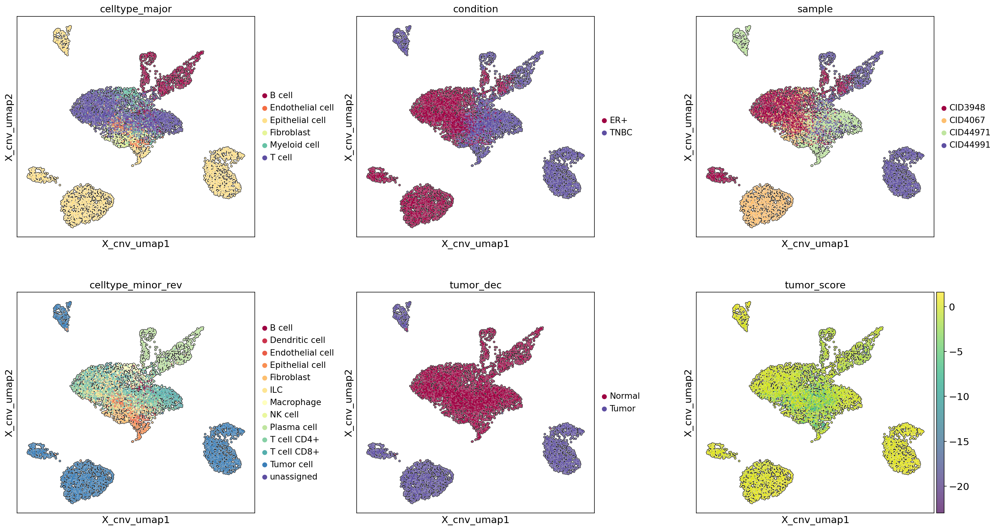

In [15]:
items_to_plot = ['celltype_major', 'condition', 'sample', 'celltype_minor_rev', 'tumor_dec', 'tumor_score'] 

sc.settings.set_figure_params(figsize=(6, 6), dpi=80, facecolor='white')
fig = sc.pl.embedding( adata, basis = 'X_cnv_umap', neighbors_key = 'cnv_neighbors',
                       color=items_to_plot, wspace = 0.3, legend_fontsize = 12, ncols = 3, 
                       palette = 'Spectral', return_fig = False, add_outline = True) 
plt.show()

In [16]:
adata_t.uns['cnv_addon_summary'].keys()

dict_keys(['adj_mat', 'agg_adj_mat', 'cnv_cluster_info', 'connectivity_threshold', 'tumor_dec_params'])

In [17]:
adata_t.uns['cnv_addon_summary']['cnv_cluster_info']

,cmean,ref_frac,tumor_dec,cluster_size,cluster_score,seed,selected,selection_order,paired_cluster,edge_wgt,threshold
cnv_cluster,,,,,,,,,,,
0,-2.137461,1,Normal,917,0.651106,True,True,2,4,399.5,0.435660
1,-1.595979,1,Normal,738,0.728758,True,True,3,4,280.3,0.379810
2,-1.272866,1,Normal,1157,0.688298,True,True,1,4,287.6,0.248574
3,-1.005305,1,Normal,275,0.756912,True,True,5,2,147.5,0.536364
4,-3.252181,1,Normal,1630,0.566623,True,True,0,0,399.5,0.435660
5,-1.547258,1,Normal,478,0.381619,True,True,4,0,15.5,0.032427
6,0.462246,0,Tumor,572,1.608888,False,False,6,4,0.2,0.000350
7,0.214068,0,Tumor,816,1.266433,False,False,7,4,5.3,0.006495
8,0.480155,0,Tumor,521,1.648567,False,False,8,4,0.7,0.001344


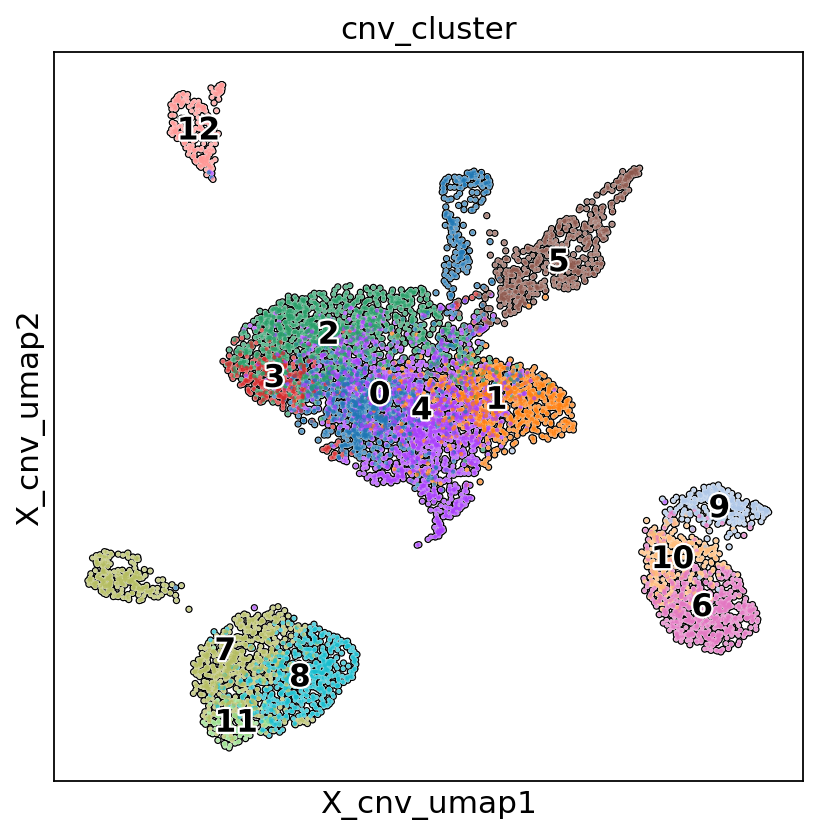

In [18]:
sc.pl.embedding( adata, basis = 'X_cnv_umap', add_outline = True, 
                 color="cnv_cluster", legend_loc="on data", legend_fontoutline=2)
plt.show()

### cell-cell interaction

In [19]:
df_dct = adata_t.uns['CCI']
cond_lst = list(df_dct.keys())
cond_lst

['ER+', 'TNBC']

In [20]:
df_dct[cond_lst[0]]

,gene_pair,cell_pair,gene_A,gene_B,cell_A,cell_B,pval,mean
ADM_RAMP3--Endothelial cell|Endothelial cell,ADM_RAMP3,Endothelial cell|Endothelial cell,ADM,RAMP3,Endothelial cell,Endothelial cell,0.000,0.9745
ADM_RAMP3--Endothelial cell|Epithelial cell,ADM_RAMP3,Endothelial cell|Epithelial cell,ADM,RAMP3,Endothelial cell,Epithelial cell,0.004,0.1940
ADM_RAMP3--Fibroblast|Endothelial cell,ADM_RAMP3,Fibroblast|Endothelial cell,ADM,RAMP3,Fibroblast,Endothelial cell,0.000,0.4385
ADM_RAMP3--Fibroblast|Epithelial cell,ADM_RAMP3,Fibroblast|Epithelial cell,ADM,RAMP3,Fibroblast,Epithelial cell,0.100,0.0835
ADM_RAMP3--Macrophage|Endothelial cell,ADM_RAMP3,Macrophage|Endothelial cell,ADM,RAMP3,Macrophage,Endothelial cell,0.000,1.1365
...,...,...,...,...,...,...,...,...
integrin_aVb1_complex_ADGRE5--Fibroblast|T cell CD8+,integrin_aVb1_complex_ADGRE5,Fibroblast|T cell CD8+,integrin,aVb1,Fibroblast,T cell CD8+,0.000,0.3775
integrin_aVb1_complex_ADGRE5--Macrophage|ILC,integrin_aVb1_complex_ADGRE5,Macrophage|ILC,integrin,aVb1,Macrophage,ILC,0.000,0.3150
integrin_aVb1_complex_ADGRE5--Macrophage|Macrophage,integrin_aVb1_complex_ADGRE5,Macrophage|Macrophage,integrin,aVb1,Macrophage,Macrophage,0.000,0.1795
integrin_aVb1_complex_ADGRE5--Macrophage|T cell CD4+,integrin_aVb1_complex_ADGRE5,Macrophage|T cell CD4+,integrin,aVb1,Macrophage,T cell CD4+,0.000,0.2740


In [21]:
df_lst = cci_get_ni_mat( df_dct, remove_common = True )

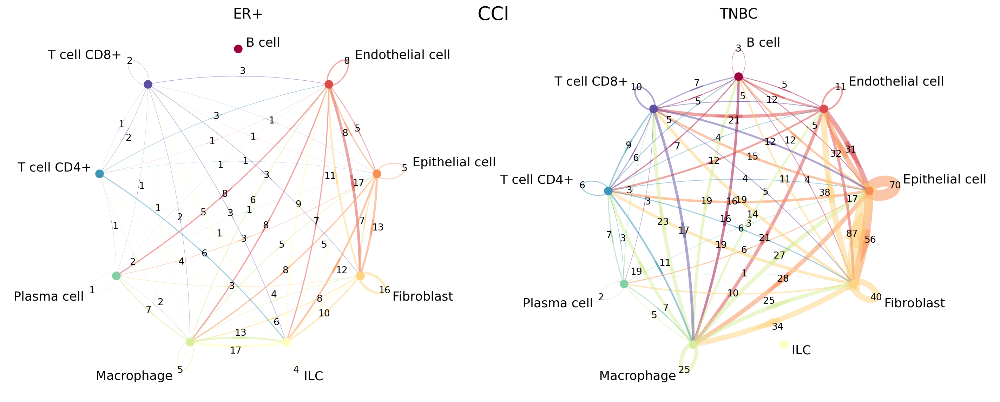

In [22]:
plot_cci_circ_m( df_lst, ncol = 2, figsize = (8,7), title = 'CCI', title_y = 1.02, 
                   title_fs = 24, text_fs = 16, num_fs = 12, margin = 0.08, alpha = 0.5, 
                   N = 500, R = 3, Rs = 0.1, lw_max = 20, lw_scale = 0.2, log_lw = False, 
                   node_size = 10, rot = False, cmap = 'Spectral', ws_hs = (0.35, 0.1) )

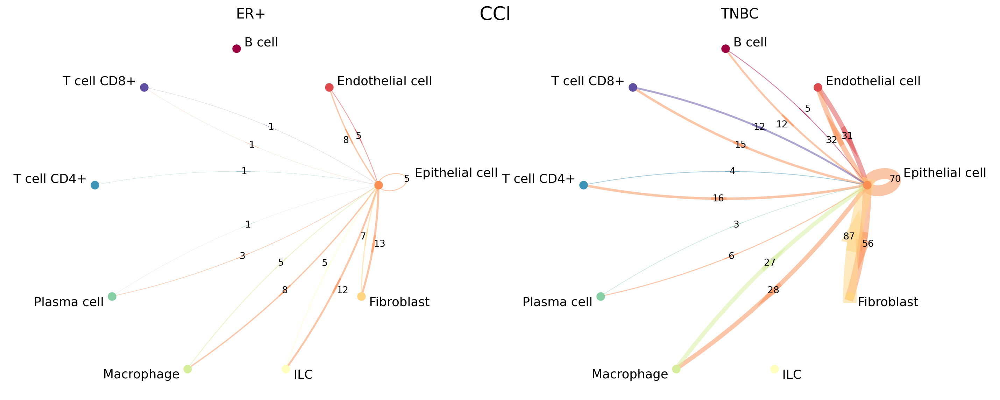

In [23]:
target = 'Epithelial cell'
df_lst2 = {}
for key in df_lst.keys():
    df = df_lst[key]
    msk = df.copy(deep = True)
    msk.loc[:,:] = 0
    msk.loc[target,:] = 1
    msk.loc[:,target] = 1
    df_lst2[key] = df*msk
    
plot_cci_circ_m( df_lst2, ncol = 2, figsize = (8,7), title = 'CCI', title_y = 1.02, 
                   title_fs = 24, text_fs = 16, num_fs = 12, margin = 0.08, alpha = 0.5, 
                   N = 500, R = 3, Rs = 0.1, lw_max = 20, lw_scale = 0.2, log_lw = False, 
                   node_size = 10, rot = False, cmap = 'Spectral', ws_hs = (0.35, 0.1) )

12 cell_pairs, 21 gene_pairs found


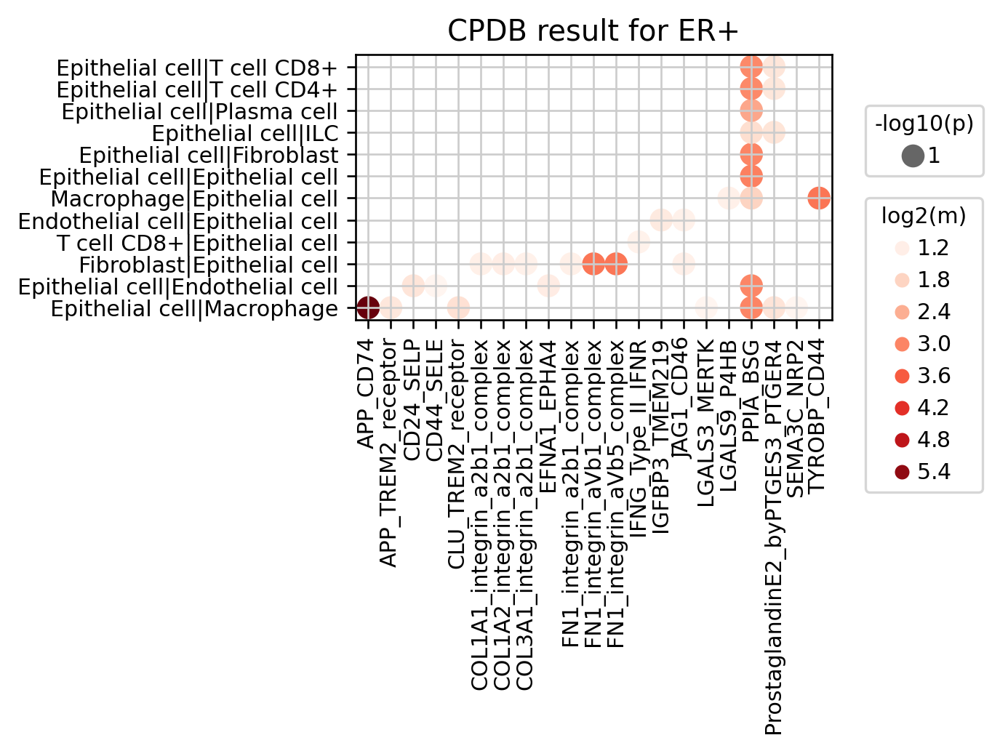

14 cell_pairs, 68 gene_pairs found


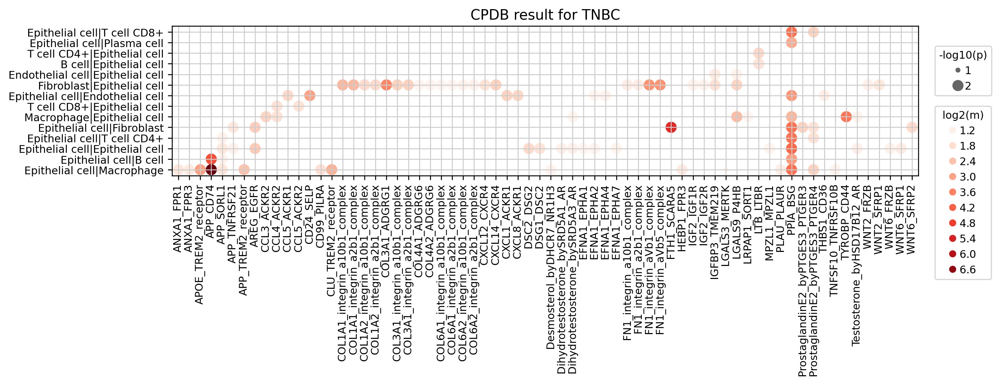

In [24]:
# df_dct_to_plot = cci_get_df_to_plot( df_dct, target_cells = ['Epithelial cell'], 
#                                      pval_cutoff = 0.01, mean_cutoff = 1 )

target_cells = ['Epithelial cell']
pval_cutoff = 0.01
mean_cutoff = 1 

df_dct_to_plot = {}
for key in df_dct.keys():
    df = df_dct[key]
    b1 = df['pval'] <= pval_cutoff
    b2 = df['mean'] >= mean_cutoff
    b3 = df['cell_A'].isin(target_cells) | df['cell_B'].isin(target_cells)
    df_dct_to_plot[key] = df.loc[b1&b2&b3, :]

## CCI: circle plot, dotplot, pairwise venn diagram
for g in df_dct_to_plot.keys():
    
    dfv = df_dct_to_plot[g]
    idxs = list(dfv.index.values)
    
    dfs = dfv.sort_values(by = ['gene_pair', 'cell_pair'])
    
    ax = plot_cci_dot( dfs, mkr_sz = 9, tick_sz = 9, 
                       legend_fs = 9, title_fs = 12, dpi = 120,
                       title = 'CPDB result for %s' % g, swap_ax = True )

### DEG

In [25]:
adata_t

AnnData object with n_obs × n_vars = 8000 × 29733
    obs: 'sample', 'condition', 'celltype_major', 'celltype_minor', 'celltype_subset', 'cnv_cluster', 'tumor_dec', 'tumor_score', 'ref_ind', 'celltype_minor_rev'
    var: 'gene'
    uns: 'CCI', 'Celltype_marker_DB', 'DEG', 'DEG_stat', 'GSA_down', 'GSA_up', 'GSEA', 'cnv', 'cnv_addon_summary', 'cnv_ref_celltypes'
    obsm: 'HiCAT_result', 'X_cnv', 'X_cnv_pca', 'cnv_addon_results'

In [26]:
nc_deg_dct = adata_t.uns['DEG_stat']
df_deg_dct = adata_t.uns['DEG']
df_deg_dct.keys()

dict_keys(['Epithelial cell', 'Fibroblast', 'Macrophage', 'Plasma cell', 'T cell CD4+', 'T cell CD8+'])

In [27]:
target_cell = 'Epithelial cell'

df_deg = df_deg_dct[target_cell]
nc_deg = nc_deg_dct[target_cell]

nc_deg

{'ER+_vs_others': {'ER+': 684, 'others': 848},
 'TNBC_vs_others': {'TNBC': 848, 'others': 684}}

In [28]:
clst = list(df_deg.keys())
clst

['ER+_vs_others', 'TNBC_vs_others']

In [29]:
df_deg[clst[0]]

,log2_FC,pval,pval_adj,mean_test,mean_ref,nz_pct_test,nz_pct_ref,nz_pct_score,Rp
AGR3,6.202000,6.992777e-256,7.758486e-252,1.952670,0.078962,0.888889,0.057783,0.789131,0.889
ESR1,6.655000,8.661093e-236,9.609483e-232,1.700430,0.043463,0.866959,0.048349,0.785152,0.867
ADIRF,6.513000,0.000000e+00,0.000000e+00,2.692242,0.140390,0.970760,0.141509,0.715456,0.971
PIP,6.609000,6.426778e-176,7.130510e-172,2.439389,0.101819,0.815789,0.067217,0.709805,0.816
CRIP1,5.992000,6.531510e-185,7.246710e-181,1.265033,0.039184,0.747076,0.056604,0.664895,0.747
...,...,...,...,...,...,...,...,...,...
ZNF711,-29.263000,3.076366e-23,3.413228e-19,0.000000,0.062444,0.000000,0.121462,0.000000,0.000
KIT,-30.270000,6.564494e-31,7.283307e-27,0.000000,0.121781,0.000000,0.169811,0.000000,0.000
BIVM,-28.783001,1.026507e-18,1.138910e-14,0.000000,0.045157,0.000000,0.096698,0.000000,0.000
GLIPR2,-29.679001,5.641112e-27,6.258814e-23,0.000000,0.082486,0.000000,0.137972,0.000000,0.000


Epithelial cell


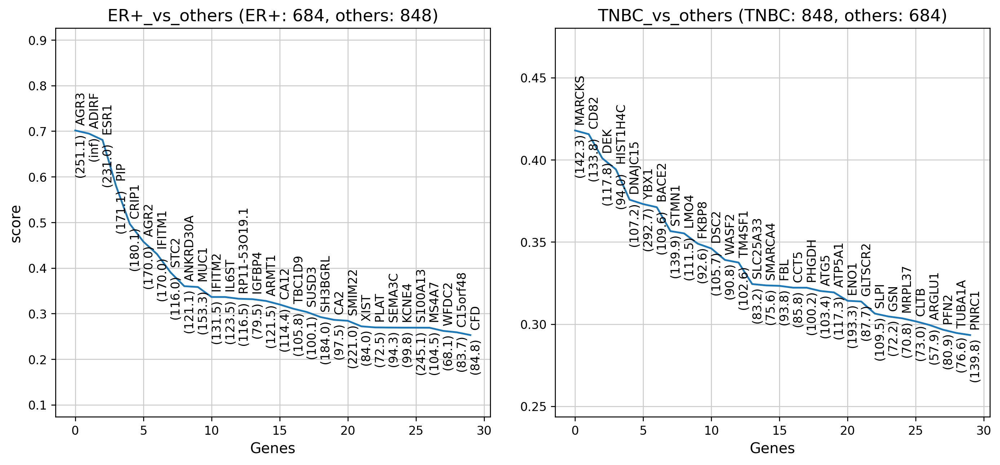

Fibroblast


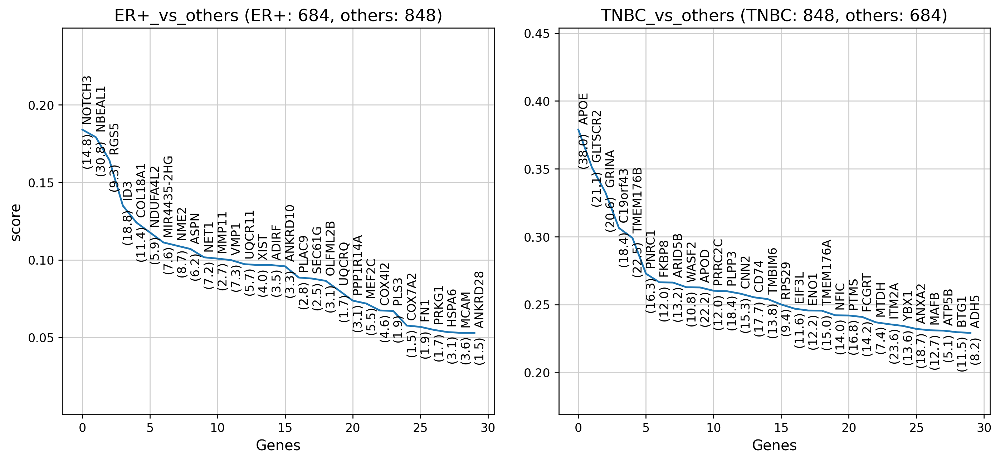

Macrophage


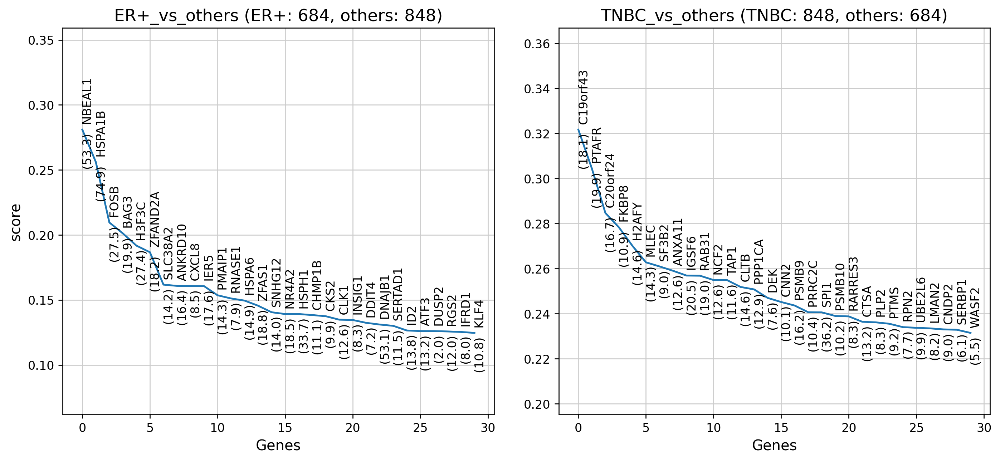

Plasma cell


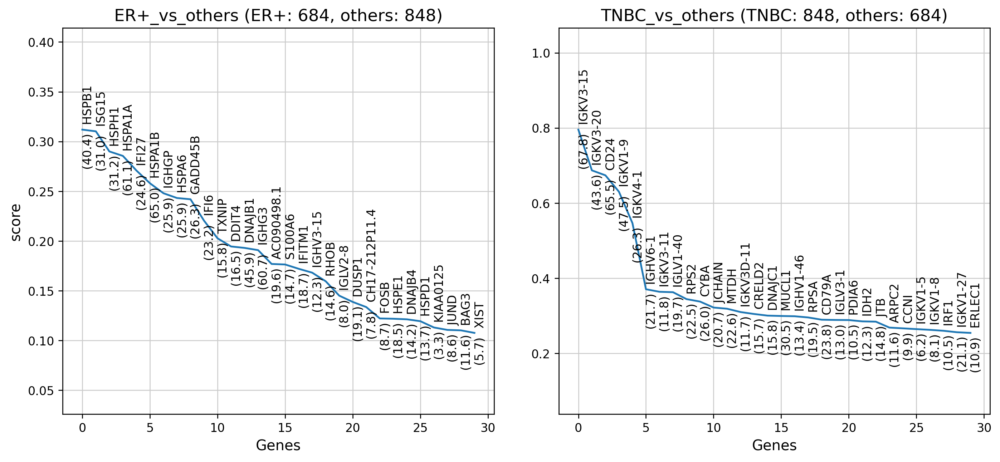

T cell CD4+


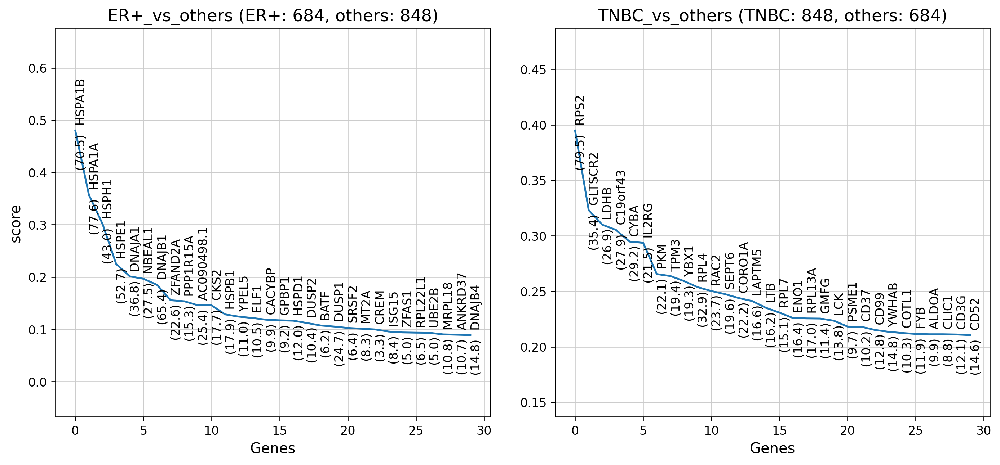

T cell CD8+


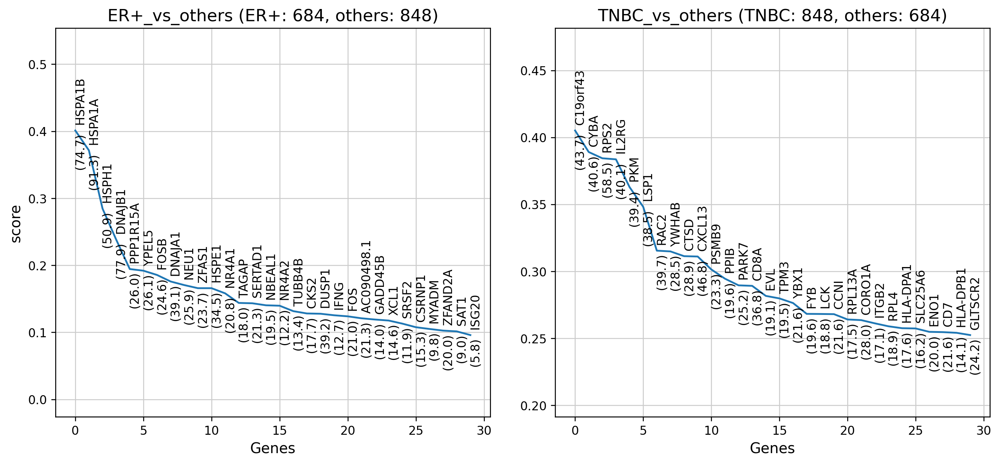

In [30]:
for key in df_deg_dct.keys():
    df_deg = df_deg_dct[key]
    for k in df_deg.keys():
        df_deg[k]['score'] = df_deg[k]['nz_pct_score']*df_deg[k]['Rp']

    print(key)
    plot_deg( df_deg, value = 'score', n_genes = 30, pval_cutoff = 0.05, 
              figsize = (6,5), text_fs = 10, title_fs = 14, label_fs = 12, 
              tick_fs = 10, ncol = 2, ws_hs = (0.15, 0.2), deg_stat_dct = nc_deg )


### Marker expression profiles

In [32]:
df_deg['ER+_vs_others']

,log2_FC,pval,pval_adj,mean_test,mean_ref,nz_pct_test,nz_pct_ref,nz_pct_score,Rp,score
HSPA1B,5.325000,4.064027e-79,2.192949e-75,2.943640,0.370617,0.773639,0.181518,0.518270,0.774,0.401141
HSPA1A,5.496000,9.932279e-96,5.359458e-92,3.592860,0.578407,0.851003,0.283828,0.436481,0.851,0.371445
HSPH1,3.869000,2.175915e-55,1.174124e-51,2.052676,0.381631,0.690544,0.227723,0.411849,0.691,0.284588
NEU1,3.581000,2.568876e-30,1.386165e-26,1.219643,0.181762,0.458453,0.099010,0.372164,0.458,0.170451
FOSB,2.987000,5.016454e-29,2.706879e-25,1.438489,0.340302,0.524355,0.178218,0.354111,0.524,0.185554
...,...,...,...,...,...,...,...,...,...,...
KRT8,-30.136000,1.150736e-05,6.209369e-02,0.000000,0.111551,0.000000,0.062706,0.000000,0.000,0.000000
DCN,-29.739000,5.956431e-05,3.214090e-01,0.000000,0.085837,0.000000,0.052805,0.000000,0.000,0.000000
DGKH,-29.547001,6.106759e-05,3.295207e-01,0.000000,0.075528,0.000000,0.052805,0.000000,0.000,0.000000
LMCD1,-29.712999,6.497015e-05,3.505789e-01,0.000000,0.084330,0.000000,0.056106,0.000000,0.000,0.000000


In [33]:
target_cell = 'Epithelial cell'

df_deg = df_deg_dct[target_cell]
nc_deg = nc_deg_dct[target_cell]

mkr_dict = get_markers_from_deg( df_deg, N_mkrs = 30, 
                                 nz_pct_test_min = 0.5, 
                                 nz_pct_ref_max = 0.1, 
                                 rem_common = True )

## Print results   
for key in mkr_dict.keys():
    print('%s (%i): ' % (key, len(mkr_dict[key])), mkr_dict[key])        


ER+ (13):  ['KCNE4', 'C15orf48', 'STC2', 'CRIP1', 'AGR3', 'RP11-53O19.1', 'SUSD3', 'PIP', 'ANKRD30A', 'ESR1', 'PLAT', 'TNNT1', 'MS4A7']
TNBC (17):  ['C12orf45', 'G6PD', 'MYCBP2', 'H2AFY2', 'MARCKS', 'MACROD1', 'BACE2', 'BTG3', 'MPHOSPH6', 'NFIB', 'UCHL3', 'QRSL1', 'SMCO4', 'PHGDH', 'VPS36', 'C6orf203', 'LMO4']


In [34]:
sample_col = 'sample'
cond_col = 'condition'

## Select cells
target_cell = 'Epithelial cell'

adata_s = adata_t[:,:]
b = adata_s.obs['celltype_minor'] == target_cell
adata_s = adata_s[b,:]

## Assign new sample name with subtype prefix
slst = list(adata_s.obs[sample_col])
clst = list(adata_s.obs[cond_col])

plst2 = []
for s, c in zip(slst, clst):
    plst2.append('%8s - %s' % (c, s))
        
pid_field = 'pid_e'
adata_s.obs[pid_field] = plst2

## Select samples with its No. of cells greater than 40
pcnt = adata_s.obs[pid_field].value_counts()
b = pcnt >= 100
plst = list(pcnt.index.values[b])

# display(pcnt[plst])
print('N_samples: ', len(plst), 'ave. N_cells: ', pcnt[plst].mean())

b = adata_s.obs[pid_field].isin(plst)
adata_ss = adata_s[b,:]

N_samples:  4 ave. N_cells:  742.25


In [35]:
adata_ss.obs['pid_e'].value_counts()

     ER+ - CID4067     1227
    TNBC - CID44991    1122
    TNBC - CID44971     392
     ER+ - CID3948      228
Name: pid_e, dtype: int64

Num markers selected: 30 -> 30


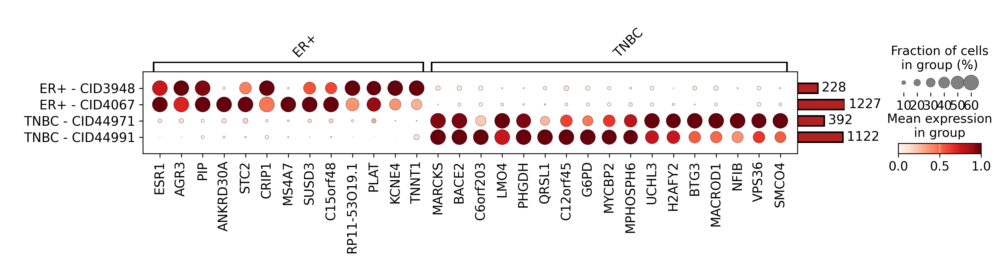

In [37]:
type_col = cond_col 
target_lst = list(adata_ss.obs[type_col].unique())
target_lst.sort()
title = 'Marker exp.'

pes, pexs, md = plot_marker_exp( adata_ss, target_lst, type_col, mkr_dict, 
                          rend = None, level = 0, cutoff = 0.05, pnsh12 = '100000', rem_cmn = True, 
                          dot_max = 0.6, fs_text = 12, swap_ax = False, to_exclude = [], 
                          comb_mkrs = False, vg_rot = 45, lw = 1.5, fs_title = 16, vg_hgt = 1.2, 
                          Npt = 20, Npt_tot = 200, ret_pe = True, legend = True,
                          type_level_g = 'pid_e', other_genes = [], show_unassigned = False, 
                          add_rect = False, standard_scale = 'var', figsize = None )
plt.show()

### GSEA

In [38]:
df_dct_enr_up = adata_t.uns['GSA_up']
df_dct_enr_dn = adata_t.uns['GSA_down']
# df_dct_enrichr = adata_t.uns['GSA']

In [39]:
df_dct_enr_up.keys()

dict_keys(['Epithelial cell', 'Fibroblast', 'Macrophage', 'Plasma cell', 'T cell CD4+', 'T cell CD8+'])

In [40]:
target_cell = 'Epithelial cell'
df_dct_enr_up[target_cell].keys()

dict_keys(['ER+_vs_others', 'TNBC_vs_others'])

In [41]:
df_res_enr = df_dct_enr_up[target_cell]['TNBC_vs_others']
df_res_enr

,pval,pval_adj,genes,overlap,pw_size,-log(p-val),-log(q-val),Term,Ind
KEGG_N_GLYCAN_BIOSYNTHESIS,0.021816,1.0,B4GALT3;MAN1A2;DPAGT1;DDOST;DPM1;RPN2;RPN1;ALG...,13,46,1.661221,0.0,KEGG_N_GLYCAN_BIOSYNTHESIS,1
KEGG_GLYCOSAMINOGLYCAN_DEGRADATION,0.098843,1.0,GLB1;IDS;GUSB;HEXA;HYAL3;GALNS,6,21,1.005055,0.0,KEGG_GLYCOSAMINOGLYCAN_DEGRADATION,1
KEGG_GLYCEROLIPID_METABOLISM,0.073218,1.0,DGKZ;GPAT3;ALDH9A1;AGPAT1;ALDH7A1;TKFC;PLPP2;P...,12,49,1.135383,0.0,KEGG_GLYCEROLIPID_METABOLISM,1
KEGG_SPHINGOLIPID_METABOLISM,0.074794,1.0,GLB1;SPTLC2;SPHK1;SGMS1;SGPP2;UGT8;PLPP2;SMPD1...,10,39,1.126132,0.0,KEGG_SPHINGOLIPID_METABOLISM,1
KEGG_GLYCOSPHINGOLIPID_BIOSYNTHESIS_LACTO_AND_NEOLACTO_SERIES,0.040894,1.0,B4GALT3;GCNT2;ST3GAL6;B3GNT3;FUT3;B4GAT1;ST3GA...,8,26,1.388336,0.0,KEGG_GLYCOSPHINGOLIPID_BIOSYNTHESIS_LACTO_AND_...,1
...,...,...,...,...,...,...,...,...,...
KEGG_CHRONIC_MYELOID_LEUKEMIA,0.000075,1.0,CRK;ARAF;RELA;E2F1;PIK3R1;CTBP2;IKBKG;PTPN11;B...,25,73,4.125426,0.0,KEGG_CHRONIC_MYELOID_LEUKEMIA,1
KEGG_ACUTE_MYELOID_LEUKEMIA,0.000263,1.0,ARAF;RELA;CEBPA;TCF7L1;PIK3R1;KIT;ZBTB16;TCF7L...,20,57,3.580054,0.0,KEGG_ACUTE_MYELOID_LEUKEMIA,1
KEGG_SMALL_CELL_LUNG_CANCER,0.000858,1.0,SKP2;MAX;RELA;PIAS4;COL4A1;APAF1;E2F1;LAMA4;CK...,25,84,3.066525,0.0,KEGG_SMALL_CELL_LUNG_CANCER,1
KEGG_NON_SMALL_CELL_LUNG_CANCER,0.001051,1.0,PIK3R1;GRB2;CCND1;E2F3;CDK4;ARAF;PLCG1;TGFA;EG...,18,54,2.978580,0.0,KEGG_NON_SMALL_CELL_LUNG_CANCER,1


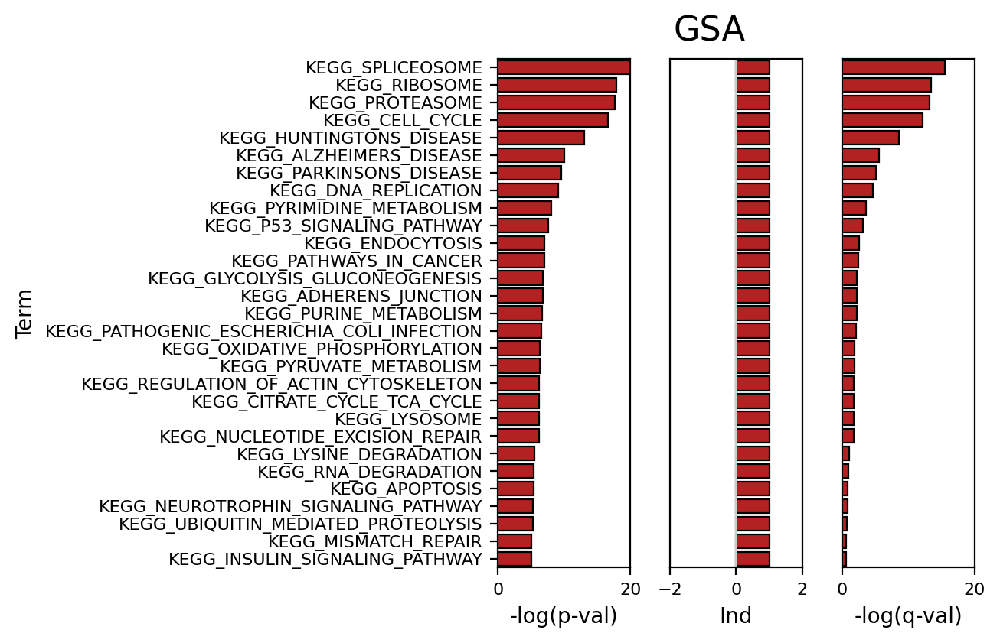

True

In [42]:
df_res = df_res_enr.copy(deep = True)
df_res = df_res.loc[df_res['-log(p-val)'] >= 5 ]

terms_sel = list(df_res.index.values)
items_to_plot = ['-log(p-val)', 'Ind', '-log(q-val)'] # , 'NES'
lims = [[0, 20], [-2, 2], [0, 20]] # , [-5, 5]

df_res = df_res.sort_values(by = '-log(p-val)', ascending = False)

plot_gsea_res( df_res, terms_sel, items_to_plot, lims, title = 'GSA',
               title_pos = (0.5, 1), title_fs = 16, title_ha = 'center',
               Ax = None)

### plot GSEA results

In [43]:
df_dct_prerank = adata_t.uns['GSEA']
df_dct_prerank.keys()

dict_keys(['Epithelial cell', 'Fibroblast', 'Macrophage', 'Plasma cell', 'T cell CD4+', 'T cell CD8+'])

In [44]:
target_cell = 'Epithelial cell'
df_dct_prerank[target_cell].keys()

dict_keys(['ER+_vs_others', 'TNBC_vs_others'])

In [45]:
df_res_pr = df_dct_prerank[target_cell]['TNBC_vs_others']
df_res_pr

,Name,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,-log(p-val),-log(q-val),Term
Term,,,,,,,,,,,,
KEGG_ABC_TRANSPORTERS,prerank,-0.674145,-1.927198,0.028269,0.905297,0.540,5/10,8.42%,ABCA2;ABCA3;ABCB10;ABCD3;ABCA1,1.548696,0.043209,KEGG_ABC_TRANSPORTERS
KEGG_GLYCOSPHINGOLIPID_BIOSYNTHESIS_LACTO_AND_NEOLACTO_SERIES,prerank,0.889228,1.832943,0.000000,0.048475,0.043,5/11,5.72%,B3GNT5;ST8SIA1;FUT3;B3GNT3;ST3GAL6,20.000000,1.314478,KEGG_GLYCOSPHINGOLIPID_BIOSYNTHESIS_LACTO_AND_...
KEGG_NEUROACTIVE_LIGAND_RECEPTOR_INTERACTION,prerank,0.739361,1.659971,0.026055,0.945272,0.777,10/22,8.47%,GABRP;TACR1;CHRM3;ADORA2B;PTH2R;P2RY6;PTGER4;A...,1.584116,0.024443,KEGG_NEUROACTIVE_LIGAND_RECEPTOR_INTERACTION
KEGG_GLYCOSPHINGOLIPID_BIOSYNTHESIS_GANGLIO_SERIES,prerank,0.892150,1.652497,0.019200,0.693096,0.808,1/5,1.07%,ST8SIA1,1.716699,0.159207,KEGG_GLYCOSPHINGOLIPID_BIOSYNTHESIS_GANGLIO_SE...
KEGG_ETHER_LIPID_METABOLISM,prerank,0.814672,1.635154,0.034125,0.664991,0.876,4/9,8.12%,PLA2G7;PLPP3;LPCAT2;PLA2G2A,1.466932,0.177184,KEGG_ETHER_LIPID_METABOLISM
KEGG_HEDGEHOG_SIGNALING_PATHWAY,prerank,0.749604,1.594250,0.052198,0.862863,0.968,2/14,2.44%,PRKX;WNT6,1.282348,0.064058,KEGG_HEDGEHOG_SIGNALING_PATHWAY
KEGG_WNT_SIGNALING_PATHWAY,prerank,0.650247,1.594002,0.008630,0.721631,0.969,7/65,3.69%,SFRP1;MMP7;PRKX;DKK1;PRICKLE1;WNT6;TCF7L1,2.063990,0.141685,KEGG_WNT_SIGNALING_PATHWAY
KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,prerank,0.669637,1.581102,0.020270,0.705325,0.977,16/40,12.50%,CX3CL1;EGFR;CXCL1;KIT;CXCL3;TGFBR2;IL2RG;CXCL8...,1.693140,0.151610,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION
KEGG_MELANOGENESIS,prerank,0.681183,1.573750,0.039616,0.670921,0.983,13/30,15.37%,KIT;PRKX;WNT6;GNAI1;TCF7L1;EDN1;TCF7L2;CAMK2D;...,1.402131,0.173329,KEGG_MELANOGENESIS


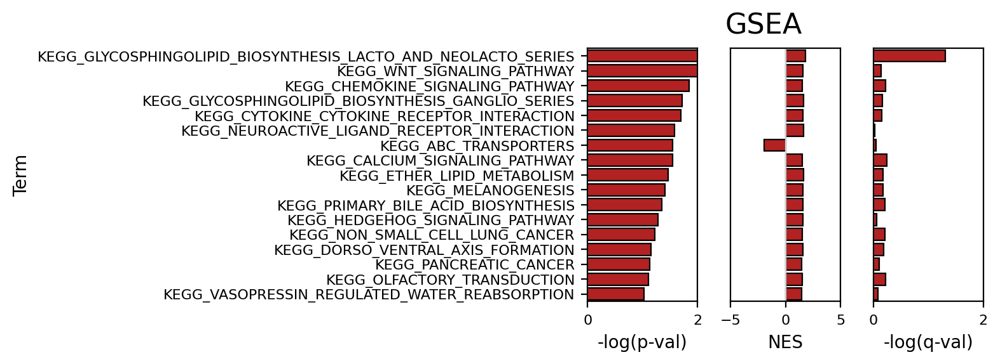

True

In [46]:
df_res = df_res_pr.copy(deep = True)
terms_sel = list(df_res.index.values)
items_to_plot = ['-log(p-val)', 'NES', '-log(q-val)']
lims = [[0, 2], [-5, 5], [0, 2]]

df_res = df_res.sort_values(by = '-log(p-val)', ascending = False)

plot_gsea_res( df_res, terms_sel, items_to_plot, lims, title = 'GSEA',
               title_pos = (0.5, 1), title_fs = 16, title_ha = 'center',
               Ax = None)

### plot GSEA summary

In [47]:
gsea_res = adata_t.uns['GSEA']
gsea_res.keys()

dict_keys(['Epithelial cell', 'Fibroblast', 'Macrophage', 'Plasma cell', 'T cell CD4+', 'T cell CD8+'])

In [48]:
df_qv, df_es = get_gsea_summary(gsea_res, max_log_p = 10)

,Epithelial cell: ER+_vs_others,Epithelial cell: TNBC_vs_others,Fibroblast: ER+_vs_others,Fibroblast: TNBC_vs_others,Macrophage: ER+_vs_others,Macrophage: TNBC_vs_others,Plasma cell: ER+_vs_others,Plasma cell: TNBC_vs_others,T cell CD4+: ER+_vs_others,T cell CD4+: TNBC_vs_others,T cell CD8+: ER+_vs_others,T cell CD8+: TNBC_vs_others
KEGG_WNT_SIGNALING_PATHWAY,2.18799,2.063990,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.0,0.000000,0.0,0.0
KEGG_VASOPRESSIN_REGULATED_WATER_REABSORPTION,0.00000,1.023975,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.0,0.000000,0.0,0.0
KEGG_UBIQUITIN_MEDIATED_PROTEOLYSIS,0.00000,0.000000,1.367809,1.497818,0.000000,0.00000,0.000000,0.000000,0.0,0.000000,0.0,0.0
KEGG_TYPE_I_DIABETES_MELLITUS,0.00000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,20.0,2.245513,0.0,0.0
KEGG_TIGHT_JUNCTION,0.00000,0.000000,0.000000,0.000000,1.664104,2.18327,1.042707,1.024622,0.0,0.000000,0.0,0.0


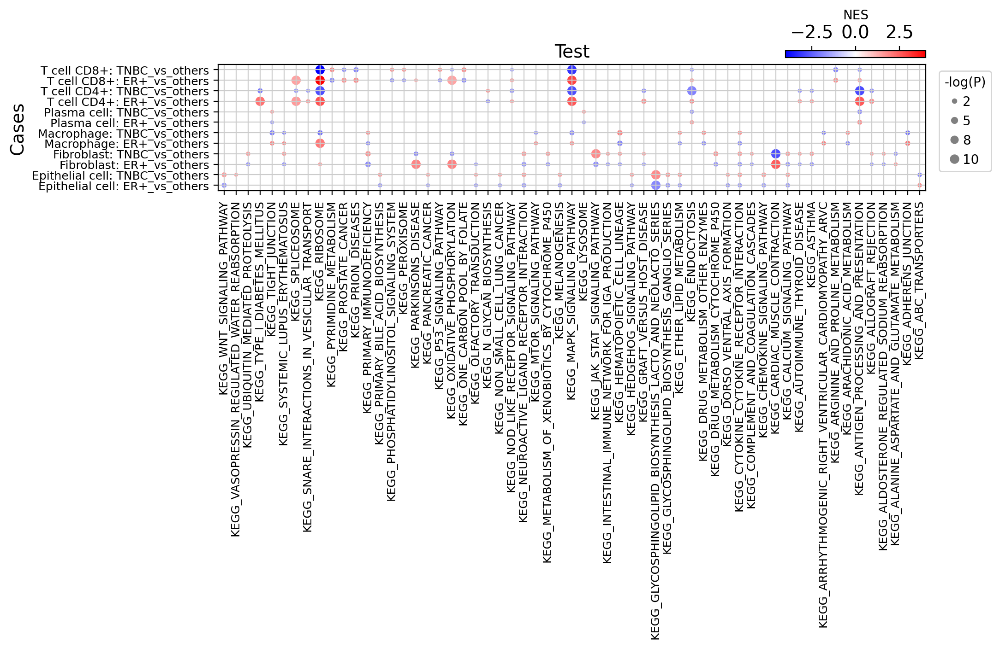

In [49]:
plot_gsea_all( df_qv, df_es, title = 'Test', title_fs = 14, 
               tick_fs = 9, tick_rot = 90, tick_ha = 'center',
               label_fs = 10, legend_fs = 10, swap_ax = True, 
               dot_size = 40, fig_size_sf = 1 )